<img src="./figures/logo_SU.png" style="height:100px">

# La corde vibrante : ondes, vibrations et plus encore !

#### Ce notebook est une extension de l'exercice de TD 

Le déplacement transverse $y(x,t)$ est solution de l'équation de d'Alembert :
\begin{equation}
\frac{1}{c_0^2} \frac{\partial^2 y}{\partial t^2} - \frac{\partial^2 y}{\partial x^2} = 0
\end{equation}
dont la solution s'écrit (cf TD)
\begin{equation}
y(x,t) = f(x-c_0 t)  + g(x + c_0 t) 
\end{equation}


## profil de la corde à t=0

On suppose qu'à $t=0$, le profil de la corde est un créneau (cf figure ci-dessous), on suppose aussi que la vitesse initiale est nulle $\frac{\partial y}{\partial t}(x,t=0) = 0$. On cherche la forme de la corde pour $t>0$.

In [16]:
import numpy as np
import matplotlib.pyplot as plt

from matplotlib import animation, rc
from IPython.display import HTML
import RefTrans as RF
import nb_utils as nbu

Text(0.5, 1.0, "profil de la corde à l'instant initial")

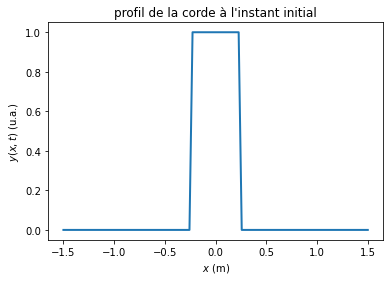

In [17]:
def rectangle(x, L=0.1):
    
    """ fonction rectangle"""
    
#    if np.abs(x)<L:
#        y=1
#    else:
#        y=0
#    return y
    ff = np.zeros_like(x)
    I=np.where(np.abs(x)<L/2)
    ff[I[0]]=1/2
    return ff
x = np.linspace(-1.5, 1.5, 100)

y0 = np.zeros_like(x)
L = 0.5
#for i in range(len(x)):
#        y0[i] = rectangle(x[i],L)
y0 = 2*rectangle(x,L)
plt.figure()
plt.plot(x,y0, lw=2)
plt.xlabel(r"$x$ (m)")
plt.ylabel(r"$y(x,t)$ (u.a.)")
plt.title("profil de la corde à l'instant initial")


## Onde progressive et rétrograde : profil de la corde à l'instant $t$

En TD, on a montré que 
\begin{equation}
y(x,t) = f(x-c_0 t) + g(x + c_0 t) 
\end{equation}

avec  $f(x) = g(x) = 1/2$ si $|x| <L/2$ 

et $f(x) = g(x) = 0$ si $|x| >L/2$

In [21]:
def f(x):
    ff = np.zeros_like(x)
    I=np.where(np.abs(x)<L/2)
    ff[I[0]]=1/2
    return ff

def g(x):
    return f(x)

c0 = 1

Nt = 100
t = np.linspace(0,3,Nt)

Nx = 200
x = np.linspace(-1.5, 1.5, Nx)
y = np.zeros((Nt, Nx))

for n in range(Nt):
    y[n,:] = f(x-c0*t[n]) + g(x+c0*t[n])
    


In [22]:
# First set up the figure, the axis, and the plot element we want to animate
fig = plt.figure()
ax = plt.axes(xlim=(x[0], x[-1]), ylim=(-1.5, 1.5))
line, = ax.plot([], [], lw=3)
text = ax.text(1,1.25,'test')
ax.grid(True)

anim = animation.FuncAnimation(fig, nbu.animate, 
                               frames=Nt, interval=20, blit=True, fargs=(line, x, y))
plt.close(anim._fig)



In [23]:
display(HTML(anim.to_jshtml()))

## Ondes stationnaires : profil de la corde à l'instant t

En TD, on a montré que 
\begin{equation}
y(x,t) = 2A sin(k_0 x) \cos(\omega_0 t) 
\end{equation}

avec $c_0=1$, $\omega_0 = k_0 / c_0$ et $k_0=\pi/L$  

In [24]:
c0 = 2
A = 0.5
Ls = 2
xs = np.linspace(0, Ls, Nx)
k0 = np.pi / Ls
omega0 = k0 * c0
y_stat = np.zeros((Nt,Nx))
for n in range(len(t)):
    y_stat[n,:] = 2 * A * np.sin(k0*xs[:])*np.cos(omega0*t[n])
    

In [25]:
# First set up the figure, the axis, and the plot element we want to animate
fig2 = plt.figure()
ax2 = plt.axes(xlim=(xs[0], xs[-1]), ylim=(-1.5, 1.5))
line2, = ax2.plot([], [], lw=3)
ax2.grid(True)
anim_stat = animation.FuncAnimation(fig2, nbu.animate, 
                               frames=Nt, interval=20, blit=True, fargs=(line2, xs, y_stat))

plt.close(anim_stat._fig)
display(HTML(anim_stat.to_jshtml()))

## Réflexion/transmission entre 2 corde de masses linéiques différentes

<img src="./figures/cordes.png" style="height:200px">

## Milieu de propagation

On calcule la vitesse de propagation des ondes :
    \begin{equation}
    c(x) = \begin{cases}
    c_1 \text{ si } x<xinter\\
    c_2 \text{ si } x\ge xinter
    \end{cases}
    \end{equation}

In [26]:
x = np.linspace(-30, 20, 1000) # maillage spatial

xinter = 0 # position de l'interface entre les deux cordes

c = np.zeros_like(x) # vitesse des ondes en tous les points du maillage
c[np.where(x<xinter)]  = 1 # corde 1
c[np.where(x>=xinter)] = 2 # corde 2

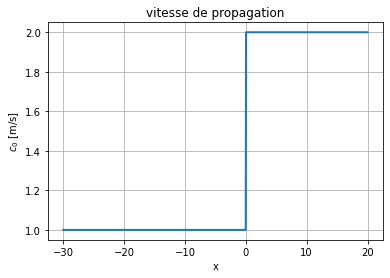

In [27]:
plt.figure()
plt.plot(x, c, lw=2)
plt.xlabel('x')
plt.ylabel(r'$c_0$ [m/s]')
plt.title("vitesse de propagation")
plt.grid()

## Condition initiale

On impose comme déformation initiale de la corde, un gaussienne centrée en $x_0$ de largeur $\sigma$ :
    \begin{equation}
    y_0(x) = exp\left( \frac{(x-x_0)^2}{\sigma^2} \right)
    \end{equation}

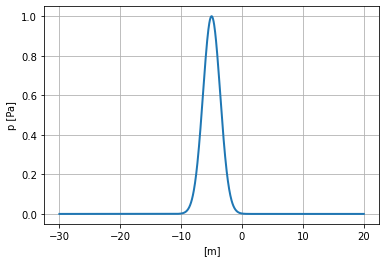

In [28]:
sigma = 2
x0 = -5
y0 = np.exp(-((x-x0)**2 )/ sigma**2)

plt.figure()
plt.plot(x, y0, lw=2)
plt.xlabel(r'[m]')
plt.ylabel(r'p [Pa]')
plt.grid()


## Propgation, réflexion et transmission

On définit d'abord led points en temps. Puis on calcule la solution pour chaque temps en utilisant la fonction sovler_WE (fournit sous forme d'un script python). Attention la définition du vecteur temps doit respecter la condition CFL : $$\frac{max(c_0) \Delta t}{\Delta x} \le 1$$

In [29]:
CFL = 1 
dt = CFL/np.max(c)*(x[1]-x[0])
t = np.arange(0, 10, dt) # start, stop, pas
print("Nombre de pas de temps : ", len(t))
sol = RF.solver_WE(x=x, t=t, p0=y0, c0=c, go=1)

Nombre de pas de temps :  400


### création de l'animation

In [30]:
# creation de la figure et des élements fixes
fig = plt.figure(figsize=(12,8))
ax = plt.axes(xlim=(x[0], x[-1]), ylim=(-1.5, 1.5))
line, = ax.plot([], [], lw=3)
interface = ax.plot(xinter*np.ones_like(x),np.linspace(-1.5, 1.5, len(x)),'k',lw=2)
ax.set_xlabel("x")
ax.set_ylabel("y(x,t)")
ax.grid(True)

# Définition de la fonction d'animation,  blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, nbu.animate,
                               frames=len(t), interval=20, blit=True, fargs=(line, x, sol.p))
plt.close(anim._fig)

In [31]:
# visulisation de l'animation dans le notebook
display(HTML(anim.to_jshtml()))

In [32]:
#anim.save('./RT_cordes.mp4', writer='ffmpeg', fps=20, dpi=100, metadata={'title':'Reflexion transmission sur entre 2 cordes'})